In [1]:
# Install plotting library 
# make sure virtualenv or conda env are active as kernel if you don't want to download on your User library
# see this if you don't know what I'm talking about: https://janakiev.com/blog/jupyter-virtual-envs/
!pip install plotly

In [10]:
import neurphys.read_pv as rpv
import neurphys.pacemaking as pace
import numpy as np
import pandas as pd
from glob import glob
import plotly.graph_objects as go
import matplotlib.pyplot as plt
%matplotlib inline

In [19]:
df = pd.read_csv('/Users/ezt309/Documents/2p/electrophys/ephys_PercevalHR/2018/RatioRmin_for3danalysis/4_16_18_s1c1_RRmin/4_16_18_s2c1_RRmin.csv') 
# read your csv file
    

In [20]:
df

,time,Frequency,CV,RRmin
0,0,0.000000,0.000000,1.046897
1,5,2.545612,5.184780,1.000000
2,10,2.684630,5.408103,1.090862
3,15,4.129306,9.236710,1.030757
4,20,4.163945,16.374059,1.027581
5,25,3.184671,94.390873,1.025515
6,30,0.000000,0.000000,1.102855


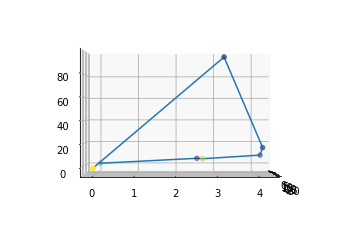

In [21]:
ax = plt.axes(projection='3d')
ax.plot3D(xs=df.time, ys=df.Frequency, zs=df.CV) 
                 # these are the column names, you can check them by print(df)
ax.scatter3D(xs=df.time, ys=df.Frequency, zs=df.CV, c=df.RRmin, cmap='viridis')
ax.view_init(0, 0) # change view
#plt.savefig('/Users/ezt309/Documents/2p/electrophys/ephys_PercevalHR/2018/RatioRmin_for3danalysis/3_21_18_s1c1_RRmin/3_21_18_s1c1_RRmin_flat.pdf')


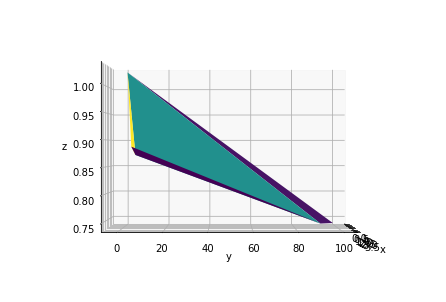

In [110]:
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure()
ax = Axes3D(fig)
ax.plot_trisurf(df.Frequency, df.CV, df.Ratio, cmap='viridis', linewidth=0.2)
ax.view_init(0, 0) # change view
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('z');
plt.show()

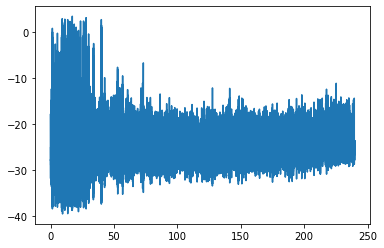

In [3]:
# Load and check recording
df = rpv.import_folder(file)['voltage recording']
plt.plot(df.time, df.primary)

In [7]:
ax = plt.axes(projection="3d")
# ax.plot3D(df.time, df.primary, df.secondary, 'gray')
#ax.plot_surface(df.time, df.primary, df.secondary, rstride=1, cstride=1,
                cmap='winter', edgecolor='none')


IndentationError: unexpected indent (<ipython-input-7-95da15cdbe4b>, line 4)

In [35]:
cv = lambda x: np.std(x, ddof=1) / np.mean(x) * 100


def plot_cv(subset, indices, xs, cvs, avg_spike_rate, means, variances, file):
    
    # Plot voltage trace and CV etc on one plot 
    
    fig = go.Figure()
    
    fig.add_trace(go.Scatter(x=subset.time, y=subset.primary, name='Voltage Trace'))
    fig.add_trace(go.Scatter(x=subset.time.iloc[indices], y=subset.primary.iloc[indices],
                        mode='markers',
                        name='Peaks'))
    fig.add_trace(go.Scatter(x=xs, y=avg_spike_rate, name='Spike Rate'))
    fig.add_trace(go.Scatter(x=xs, y=cvs, name='Coefficient of Variation'))
    fig.add_trace(go.Scatter(x=xs, y=means, name='Mean'))
    fig.add_trace(go.Scatter(x=xs, y=variances, name='Variance'))
    
    
    fig.update_layout(
        title="{}".format(file.split('/')[-1]),
        xaxis_title="Time (S)",
        yaxis_title="V (mV)")
    fig.show()  

    # To plot seperate figure for CV, mean, variance
    
#     fig_cv = go.Figure()
#     fig_cv.add_trace(go.Scatter(x=xs, y=cvs, name='Coefficient of Variation'))
#     fig_cv.add_trace(go.Scatter(x=xs, y=means, name='Mean'))
#     fig_cv.add_trace(go.Scatter(x=xs, y=variances, name='Variance'))
    
#     fig_cv.update_layout(
#         title="{} CV".format(file.split('/')[-1]),
#         xaxis_title="Time (S)",
#         yaxis_title="CV")
#     fig_cv.show()  


def calculate_cv(df, window, stride, start, stop, file):

    
    no_isi = 0 
    
    window_end = window

    mask = (df.time >= start) & (df.time <= stop)
    subset = df[mask]
    
    window_mask = [0] * subset.count().time
    num_windows = 1

    avg_spike_rate = []
    cvs = [] 
    means = []
    variances = []

    indices = pace.detect_peaks(subset.primary, mph=-10, mpd=20)
#     print("Indices:{}".format(indices))
    spike_times = subset.iloc[indices].time.values
#     print("Times:{}".format(times))
    isi = spike_times[1:] - spike_times[:-1]
#     print("ISI:{}".format(isi))

    while window_end < subset.count().time:

        window_isi = []

        window_times = subset.iloc[window_end - window:window_end].time.to_numpy()

        # Check if spike in window
        if np.any(np.in1d(spike_times, window_times)):
            for time in window_times:
                if np.isin(time, spike_times):
                    window_isi.append(isi[np.where(spike_times == time)[0]-1][0])


        if len(window_isi) > 1:
            avg_spike_rate.append(len(window_isi)/np.sum(window_isi))
            std = np.std(window_isi, ddof=1) 
            variances.append(std**2)
            mean = np.mean(window_isi) * 100
            means.append(mean)
            window_cv = cv(window_isi) 
            cvs.append(window_cv) 
            window_mask[num_windows] = 1
        else:
            no_isi += 1
            window_mask[num_windows] = 0

        window_end += stride 
        num_windows += 1

    xs = subset.time.to_numpy() * window_mask
    xs = xs[xs != 0] * 1000
        
    plot_cv(subset, indices, xs, cvs, avg_spike_rate, means, variances, file)
    
    return subset, spike_times, isi, indices, xs, cvs, avg_spike_rate, means, variances, num_windows, no_isi, window_mask


In [36]:
window = 5000
stride = 1000
start = df.time[0]
stop = df.time[-1]

subset, spike_times, isi, indices, xs, cvs, avg_spike_rate, means, variances, num_windows, no_isi, window_mask = calculate_cv(df, window, stride, start, stop, file)


In [37]:
# Save data to csv
d = {'Time (ms)': xs, 'CV': cvs, 'Avg Spike Rate (mHz)': avg_spike_rate}
df_csv = pd.DataFrame(data=d)
print(df_csv)
df_csv.to_csv(file + 'CV_Hz_W5_S1_.csv')

    Time (ms)          CV  Avg Spike Rate (mHz)
0         1.0  222.904494              0.368537
1         2.0  250.814687              0.519652
2         3.0  115.475015              1.537574
3         4.0  115.475015              1.537574
4         5.0  127.198508              2.533619
5         6.0  140.512933              3.414634
6         7.0  126.759607              4.385091
7         8.0  125.411852              5.077133
8         9.0  125.001230              5.236581
9        10.0  116.805061              5.337023
10       11.0  114.596773              4.773270
11       12.0  118.162243              5.451242
12       13.0  118.525204              5.264224
13       14.0  117.468141              5.402277
14       15.0   97.383418              5.883589
15       16.0  100.029696              5.738248
16       17.0   98.285828              4.746835
17       18.0   95.633881              5.037276
18       19.0   95.811930              4.780530
19       20.0  125.445609              3

In [48]:
# Sidenote: the # of windows should equal the # of CV calculations + windows without # of spikes for calculation = # nonzero entries in window_mask
# len(cvs) + no_isi = num_windows -1 = window_mask > 0

418

In [33]:
fig = go.Figure()

fig.add_trace(go.Scatter(x=spike_times, y=1/isi, name='Spike Rate'))
fig.add_trace(go.Scatter(x=xs, y=avg_spike_rate, name='Avg Spike Rate'))


fig.update_layout(
    title="{}".format(file.split('/')[-1]),
    xaxis_title="Time (S)",
    yaxis_title="Spike Rate (mHz)")
fig.show() 